In [33]:
import librosa
import matplotlib.pyplot as plt
import IPython.display as ipd
import scipy.signal as signal
import numpy as np

#keep

# Audio signal in python

In [34]:
def make_sinewave(f0, dur, fs):
    """Generate a sine wave
    Args:
        f0: waveform frequency in Hz
        dur: duration in seconds
        fs: sample frequency in Hz
    """
    num_samples = int(dur * fs)
    sample_step_size = 2 * np.pi * f0 / fs
    x = sample_step_size * np.arange(num_samples, dtype='float32')
    return np.sin(x)

#keep

Generate a sine waveform of 1 second with frequency 440Hz and sample frequency 44100.

In [35]:
sample_freq = 44100
sin:np.array = make_sinewave(440, 1, sample_freq)

Listen to the waveform using [`ipd.Audio`](https://ipython.org/ipython-doc/dev/api/generated/IPython.display.html#IPython.display.Audio)

In [36]:
ipd.Audio(data=sin, rate=sample_freq)

The generated waveform is a [numpy](https://numpy.org/doc/2.0/index.html) array. Numpy arrays are fundamental data containers for scientific computations in python. We will also use them in this lab to represent (processed) audio signals.

Print the waveform values, its [shape](https://numpy.org/doc/2.0/reference/generated/numpy.ndarray.shape.html) its [data type](https://numpy.org/doc/2.0/reference/generated/numpy.ndarray.dtype.html) and its [maximum](https://numpy.org/doc/2.0/reference/generated/numpy.ndarray.max.html) and [minimum](https://numpy.org/doc/2.0/reference/generated/numpy.ndarray.min.html) values.

In [37]:
print(f"shape = {sin.shape}\ndata_type = {sin.dtype}\nmax = {sin.max()}\nmin = {sin.min()}")

shape = (44100,)
data_type = float32
max = 0.9999998211860657
min = -0.9999997615814209


Plot the first 512 samples of the waveform with matplotlib

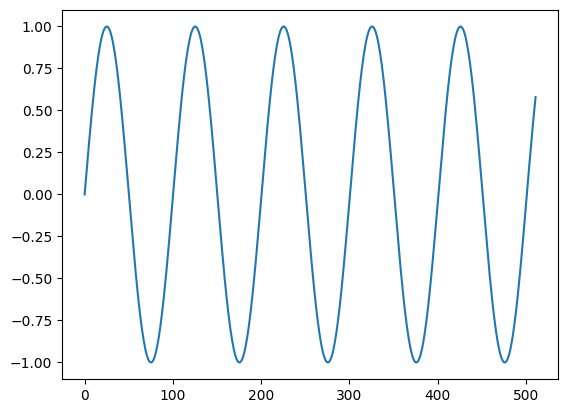

In [42]:
plt.plot(sin[0:512])
plt.show()

# Discrete Fourier Transform (DFT)

One of the most important analysis domains in audio processing is the frequency domain.

1) Plot the frequency domain of the sine wave using the function below (`plot_fft`).

2) Plot the frequency domain a second time, but change the window function to [`np.hamming`](https://numpy.org/doc/2.0/reference/generated/numpy.hamming.html) and compare both plots. Note down your observations in this markdown cell.

Observations:

In [43]:
def plot_fft(x, fs, window_fn=np.ones, n_fft=1024, plot_fmax=2500, show_cft=True):
    """Calculate the fft with numpy and plot it with matplotlib

    Args:
        x:          audio signal
        fs:         sample frequency of the audio signal
        window_fn:  Window function to use. By default rectangular (np.ones)
        n_fft:      the number of fft bins to use
        plot_fmax:  maximum frequency value to plot on the x-axis
        show_cft:   If True, also plot the continous frequency domain
    """
    win = window_fn(n_fft)
    x_seg = x[:n_fft] * win             # take a slice and multiply by the window
    y = np.fft.rfft(x_seg)              # calculate the real-valued fft
    y_mag = np.abs(y) * 2 / np.sum(win) # Calculate the magnitude (abs) and normalize it between 0 and 1
    y_mag_db = 20 * np.log10(y_mag)     # Convert to db scale

    plt.figure(figsize=(8, 3))
    
    if show_cft:
        w, h = signal.freqz(x_seg, 1, worN=8*n_fft, fs=fs)
        h_mag = np.abs(h) * 2 / np.sum(win)
        h_mag_db = 20 * np.log10(h_mag)
        plt.plot(w, h_mag_db, color='gray', linestyle='--', label="Continuous")

    freq = np.fft.rfftfreq(n_fft, d=1/fs)  # create x-axis values in Hz
    plt.plot(freq, y_mag_db, '.-', label="Discrete")
    plt.grid()
    plt.xlim([0, plot_fmax])
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Amplitude [dB]')
    plt.legend()

#keep

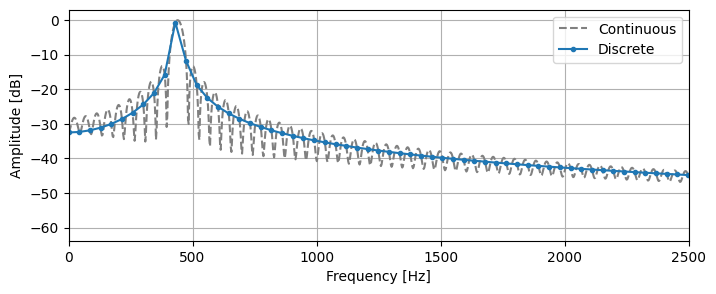

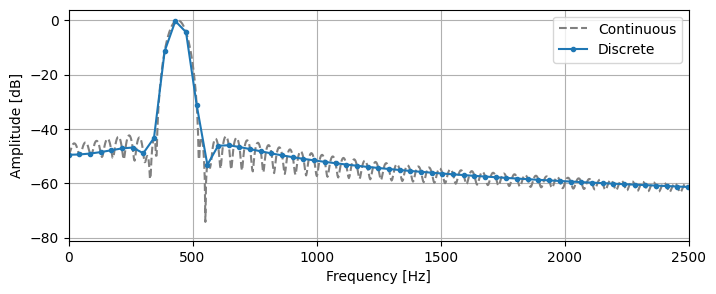

In [46]:
plot_fft(sin, fs=sample_freq)
plot_fft(sin, fs=sample_freq, window_fn=np.hamming)

Create a new sine wave with a fundamental frequency $f_0 = \frac{f_s}{N}$ with $f_s$ the sample frequency and $N$ a power-of-two value (2, 4, 8, 16,...).

Plot the frequency response and note down your observations in this markdown cell. Repeat with the hamming window.

Observations: De punten waarop gesampled wordt liggen onderaan de sinc functie

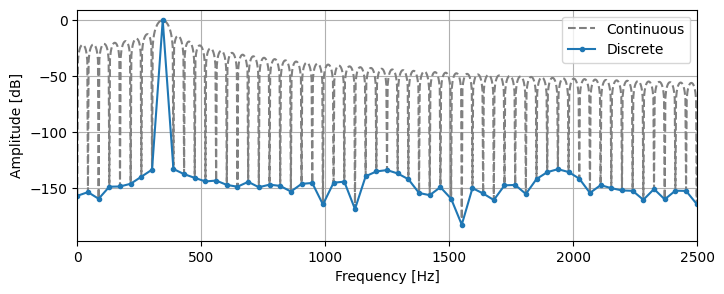

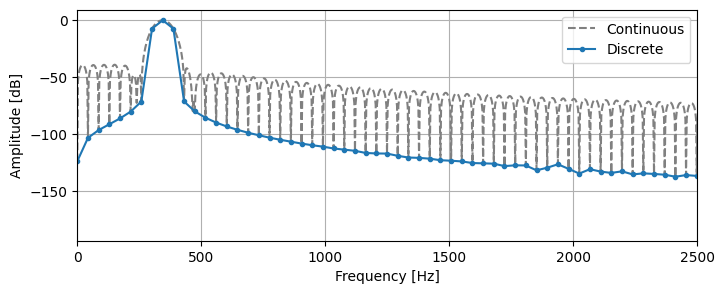

In [57]:
n=128
f0 = sample_freq/n
sin_2 = make_sinewave(f0, 1, fs=sample_freq)
plot_fft(sin_2, fs=sample_freq)
plot_fft(sin_2, fs=sample_freq, window_fn=np.hamming)

Generate a sawtooth waveform of 1 second with frequency 440Hz and sample frequency 44100, and listen to the waverform

In [60]:
def make_sawwave(f0, dur, fs):
    num_samples = int(dur * fs)
    sample_step_size = 2 * np.pi * f0 / fs
    x = sample_step_size * np.arange(num_samples)
    return signal.sawtooth(x)

#keep

In [62]:
fs = 44100
saw = make_sawwave(440, 1, fs=fs)
ipd.Audio(data=saw, rate=fs)

Plot the first 512 samples of the waveform with matplotlib

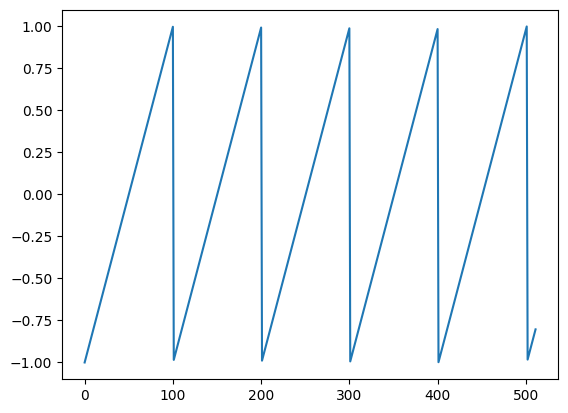

In [63]:
plt.plot(saw[:512])

1) Plot the frequency domain of the sine wave using `plot_fft`.

2) Change the window function to [`np.hamming`](https://numpy.org/doc/2.0/reference/generated/numpy.hamming.html) and compare both plots. Note down your observations in this markdown cell.

Observations: the hamming one is more spread out, but supresses the signal that isn't f0 faster

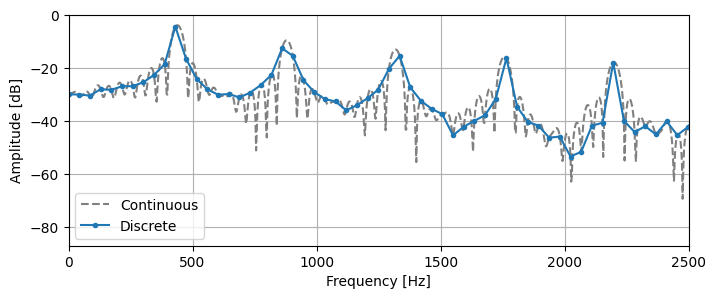

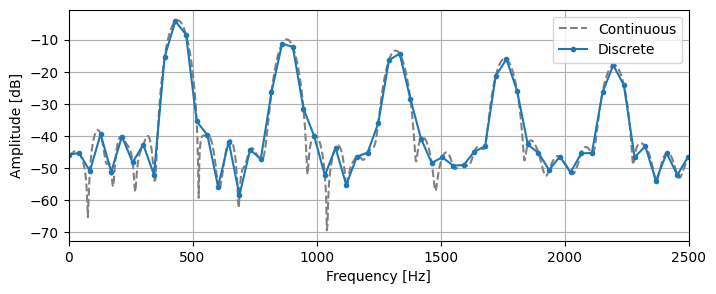

In [66]:
plot_fft(saw, fs=fs)
plot_fft(saw, fs, np.hamming)

# Loading audio files

To help us with audio processing during this lab course, we will be using the [`librosa`](https://librosa.org/doc/latest/index.html) package in addition to numpy. `librosa` works with numpy audio arrays and contains many useful utilities for music and audio analysis.

Use [`librosa.load`](https://librosa.org/doc/latest/generated/librosa.load.html#librosa.load) to load the `samples/095_Coffee_House_10s.wav` music fragment.

In [76]:
coffee_house, fs = librosa.load("samples/095_Coffee_House_10s.wav")

Print the sample frequency, the shape and data type of the loaded audio fragment.

In [77]:
print(f"fs = {fs}, shape = {coffee_house.shape}, dtype = {coffee_house.dtype}")

fs = 22050, shape = (221556,), dtype = float32


Listen to the audio fragment. Then play the audio fragment at double the sample rate and also half the sample rate. What happens?
fs*2 => dubbel zo snel, dubbel zo hoog in frequentie (440Hz-> 880Hz)
fs/2 => dubbel zo traag, dubbel zo laag in frequentie (440Hz -> 220Hz)

Hint: if you write `display(ipd.Audio(...))` instead of `ipd.Audio`, you can play multiple audio samples in one code cell.

In [84]:
display(
    ipd.Audio(data=coffee_house, rate=fs),
    ipd.Audio(data=coffee_house, rate=2*fs),
    ipd.Audio(data=coffee_house, rate=fs/2)
)

Reload the same music fragment but provide the following additional keyword arguments: `mono=False` and `sr=None`.

In [86]:
coffee_house_stereo, fs = librosa.load("samples/095_Coffee_House_10s.wav", mono=False, sr=None)
display(
    ipd.Audio(data=coffee_house_stereo, rate=fs),
    ipd.Audio(data=coffee_house_stereo, rate=2*fs),
    ipd.Audio(data=coffee_house_stereo, rate=fs/2)
)

Print the sample frequency, the shape and data type of the loaded audio fragment. Listen to it.

In [87]:
print(f"fs = {fs}, shape = {coffee_house_stereo.shape}, dtype = {coffee_house_stereo.dtype}")

fs = 44100, shape = (2, 443112), dtype = float32


Select only the first channel of the stereo sample and plot its waveform

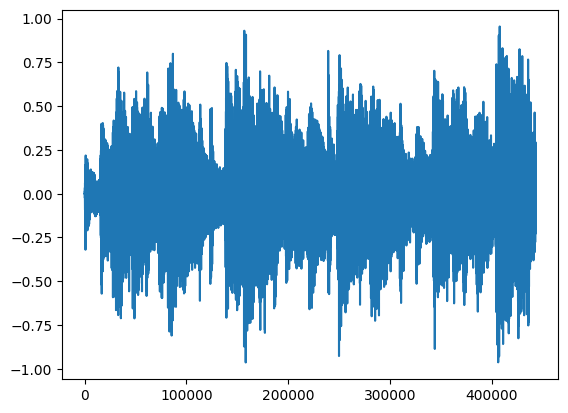

In [89]:
plt.plot(coffee_house_stereo[0])
plt.show()

# Short-Time Fourier Transform

The DFT (or FFT) is great for analysing periodic signals, but cannot handle signals that vary over time. The STFT solves this in an elegant way.

Calculate the STFT of the music sample using [`librosa.stft`](https://librosa.org/doc/main/generated/librosa.stft.html). Print the shape of the output and its values. What is the purpose of `j` in these values? Complex getal

Calculate the magnitude with `np.abs` and display the STFT or spectogram output with [`librosa.display.specshow`](https://librosa.org/doc/main/generated/librosa.display.specshow.html). Provide `librosa.display.specshow` with the following keyword arguments `y_axis='linear', x_axis='time'` and set `sr` to the correct sample frequency.

shape = (2, 1025, 866)
[[[ 5.0514401e-03+0.0000000e+00j  2.1661639e-03+0.0000000e+00j
   -8.1899120e-03+0.0000000e+00j ...  9.8090827e-01+0.0000000e+00j
    5.4735327e-01+0.0000000e+00j  6.3314137e+00+0.0000000e+00j]
  [ 3.9660078e-03+9.3003456e-03j  1.5983889e-03+1.5513667e-02j
   -1.2529513e-02+7.6421420e-03j ...  3.4799166e+00+2.9686379e+00j
    5.3374785e-01-3.9304585e+00j -6.1455383e+00+9.4465523e+00j]
  [-2.8551351e-03+2.1893453e-02j -3.1443488e-02+5.8468543e-02j
   -3.8484376e-02+6.1246209e-02j ... -1.8636473e+01-1.7414946e+01j
   -1.0600899e+00+2.6167864e+01j  1.4925475e+01-1.9061926e+01j]
  ...
  [ 3.0622771e-04+2.1189102e-03j  1.8046036e-03-2.3559809e-03j
   -3.3521266e-03+2.5701423e-03j ...  9.8846192e-03-6.1898986e-03j
   -6.6739176e-03+1.7053419e-03j  5.3771753e-03+8.7481905e-03j]
  [-1.4791278e-03-1.5214937e-03j -1.1776810e-03+3.1026646e-03j
    2.4129595e-03-7.2897365e-04j ... -1.6448516e-03+5.1733889e-03j
    1.1215612e-02-1.2089141e-03j -5.3182356e-03-9.0529947e-03j]
 

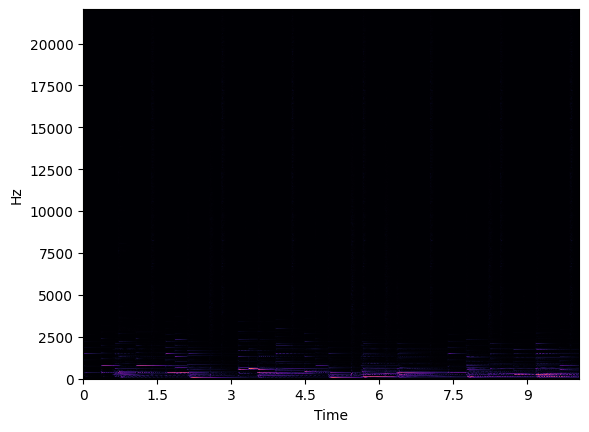

In [96]:
stft_coffee_house_stereo = librosa.stft(coffee_house_stereo)
print(f"shape = {stft_coffee_house_stereo.shape}\n{stft_coffee_house_stereo}")

mag = np.abs(stft_coffee_house_stereo[0])
print(mag)
librosa.display.specshow(data=mag, y_axis='linear', x_axis='time', sr=fs)


The output seems very dark. Lets display it in dB. Use [`librosa.amplitude_to_db`](https://librosa.org/doc/main/generated/librosa.amplitude_to_db.html) and provide `ref=np.max` as keyword argument. Print the output values.

Plot the spectogram and add the line:

```python
plt.colorbar(format='%+2.0f dB')
```

after the `librosa.display.specshow` call to get a colorbar legend.


[[-80.       -80.       -80.       ... -46.611855 -51.67907  -30.41441 ]
 [-80.       -80.       -80.       ... -33.238262 -34.4762   -25.406216]
 [-79.564896 -70.00273  -69.25763  ... -18.311295 -18.081936 -18.764507]
 ...
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]


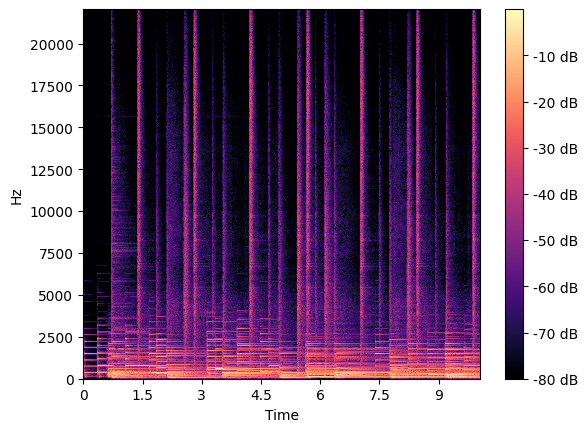

In [101]:
mag_db = librosa.amplitude_to_db(S=mag, ref=np.max)
print(mag_db)
librosa.display.specshow(data=mag_db, y_axis='linear', x_axis='time', sr=fs)
plt.colorbar(format='%+2.0f dB')

Notice that most of the energy in the spectrogram is located in the lower frequency bins. This is because audio signals meant for human hearing, such as music or speech, follow non linear frequency patterns that match our ears's non linear sensitivity to frequencies.
Therefore, the logaritmic frequency scale is more convenient for music or speech analysis.

Visualize the previous spectrogram with logaritmic frequency scale.

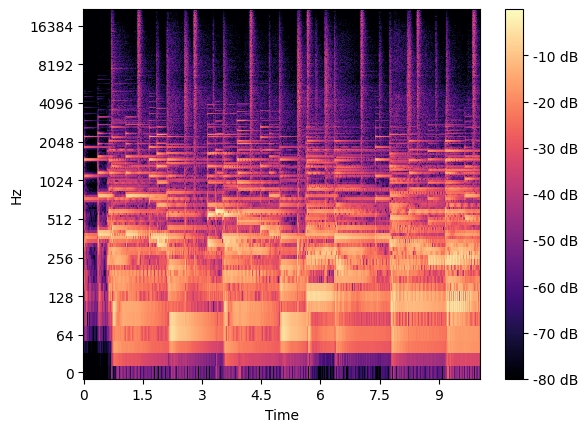

In [102]:
librosa.display.specshow(data=mag_db, y_axis='log', x_axis='time', sr=fs)
plt.colorbar(format='%+2.0f dB')

Each column in the spectrogram is a DFT of a short audio fragment. The length (time axis) of each fragment is defined by the `win_length` argument and the distance between two consecutive fragments is defined by the `hop_length`, both defined in number of samples.

Recreate the previous spectrogram, but now with a hop length of 10ms and a window length of 15ms.

When displaying the spectrogram, make sure the time axis follows the modified hop length (otherwise the time axis will not be correct).

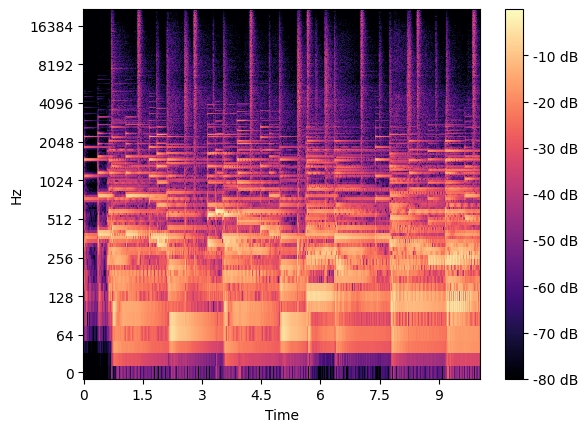

In [110]:
stft_coffee_house_stereo = librosa.stft(coffee_house_stereo, win_length=int(0.015*fs), hop_length=int(0.01*fs))

librosa.display.specshow(data=mag_db, y_axis='log', x_axis='time', sr=fs)
plt.colorbar(format='%+2.0f dB')